- not import NumPy, OpenCV or any other Imaging Library

## Classes

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg


### Custom Array


In [ ]:
from collections.abc import Sequence
import copy

class array:
  def __init__(self, arr):
    if type(arr) == array:
      self.arr = copy.deepcopy(arr.get_array())
    else:
      assert(type(arr) == list)
      self.arr = copy.deepcopy(arr)
  
  def __getitem__(self, key):
      return self.arr[key]

  def __setitem__(self, key, v):
      self.arr[key] = v

  def get_array(self):
    return self.arr

  def copy(self):
    assert(type(self.arr) == list)
    return array(copy.deepcopy(self.arr))

  def shape(self):
    return self.__get_shape(self.arr)

  def __get_shape(self,lst, shap=()):
    if not isinstance(lst, Sequence) or type(lst) !=  list:
        # base case
        return shap

    if isinstance(lst[0], Sequence):
        l = len(lst[0])
        if not all(len(item) == l for item in lst):
            msg = 'not all lists have the same length'
            raise ValueError(msg)

    shap += (len(lst), )

    shap = self.__get_shape(lst[0], shap)

    return shap

### ImageProcessing

In [ ]:
class ImagePreprocessing:
  def __init__(self, img):
    self.img = array(img)
  
  def cropImage(self, x,y, w,h, res):
    assert(res.shape() >= (h,w))

    row_slices = res[x:x+h]
    col_slices = [sublist[y:y+w] for sublist in row_slices]
    res = col_slices
    return res 

  def createImageWithPadding(self, l):
      h,w,c = self.img.shape()
      h_r,w_r = (h+l*2, w + l*2)
      res = [[[0 for i in range(c)] for i in range(w_r)] for j in range(h_r)] 
      return array(res)

  def createGrayImageWithZeros(self,w,h):
      aux = [[0 for i in range(w)] for i in range(h)] 
      return array(aux)

  def createImageWithZeros(self,w,h):
      aux = [[[0 for i in range(3)] for i in range(w)] for j in range(h)] 
      return array(aux)

  def copyImageBorder(self, res, l):
      img = self.img
      h,w,c = img.shape()
      h_r,w_r = (h+l*2, w + l*2)

      for i in range(0,h):
        for fx in range(0,l):
          res[i + l][fx] = img[i][fx]
          res[i + l][h_r - 1 - fx] = img[i][h - 1 - fx]

      for i in range(0,w):
        for fx in range(0,l):
          res[fx][i + l] = img[fx][i]
          res[h_r - 1 - fx][i +l] = img[h - 1 - fx][i]

      res = array(res)
      return res

  def copyImageContent(self, x,y, res):
    cImage = self.img

    assert(res.shape() > self.img.shape())

    h,w,c = cImage.shape()
    for i in range(h):
      for j in range(w):
        res[i+x][j+y] = cImage[i][j]
    return array(res)

  def copyImageContentWithBorder(self, res, l):
    res = self.copyImageBorder(res, l)
    res = self.copyImageContent(l, l, res)
    return array(res)


### ImageEditor

In [ ]:
class ImageEditor(ImagePreprocessing):
    def __init__(self, img):
      super().__init__(img)

    __instance = None
    def __new__(cls, val):
        """Singleton to avoid multiple instances"""
        if ImageEditor.__instance is None:
            ImageEditor.__instance = object.__new__(cls)
        ImageEditor.__instance.val = val
        return ImageEditor.__instance

    def callMethod(self, name, *args, **kwargs):
      """Use for show plots"""
      return getattr(self, name)(*args, **kwargs)

    def __reduceNoiseInChannel(self, mask_img, channel=0, kernel_size=3):
      """Use kernel as square and apply reduceNoise to a channel."""
      h,w,c = mask_img.shape()
      res = mask_img.copy()

      l = kernel_size//2

      for x in range(l,w - l):
        for y in range(l,h - l):
          tmp = []
          for fx in range(0,kernel_size):
            for fy in range(0,kernel_size):
              value = mask_img[x + fx - l][y + fy - l][channel]
              tmp.append(value)

          tmp = sorted(tmp)
          res[x][y][channel] = tmp[len(tmp)//2]

      return res

    def denoiseFilter(self, kernel_size=3):
      """Use an auxiliar image with padding to denoise all image including boundaries."""
      h,w,c = self.img.shape()
      l = kernel_size//2 
      channels = range(c)

      res = self.createImageWithPadding(l)
      res = self.copyImageContentWithBorder(res, l)

      for channel in channels:
        res = self.__reduceNoiseInChannel(res, channel, kernel_size)
      return self.cropImage(l,l,w,h,res)

    def RGBToGrayscale(self,mode='luminosity'): 
      """Use 3 differents converting to grayscale."""
      def luminosity(i,j,img):
          return 0.21 * img[i][j][0] + 0.72 * img[i][j][1] + 0.07 * img[i][j][2]

      def average(i,j,img):
          return (img[i][j][0] + img[i][j][1] + img[i][j][2])/3.0

      def lightness(i,j,img):
          maxi = max(img[i][j][0], img[i][j][1],img[i][j][2])
          mini = min(img[i][j][0], img[i][j][1],img[i][j][2])
          return (maxi + mini)/2.0

      def select_by_mode(i,j,img):
        if mode == 'luminosity':
          return luminosity(i,j,img)
        elif mode == 'average':
          return average(i,j,img)
        else:
          return lightness(i,j,img)

      modes = ['luminosity', 'average', 'lightness']
      assert((mode in modes) == True)
      h,w,c = self.img.shape()
      img = self.img
      g_img = self.createGrayImageWithZeros(w,h)
      for i in range(0,h):
        for j in range(0,w):
          g_img[i][j] =  select_by_mode(i,j,img)

      return g_img.get_array()

    def sharpeningFilter(self,intensity=0.3):
      """Use unsharp mask technique with median filter."""
      def convertRange(v):
        old_value = v 
        old_min = 0
        old_max = 1.0 
        new_min = 0.0
        new_max = 2 
        nv = ( (old_value - old_min) / (old_max - old_min) ) * (new_max - new_min) + new_min
        return nv

      def truncate(v):
        if v > 255:
          return 255
        elif v < 0:
          return 0
        else:
          return int(v)
      assert(intensity >= 0 and intensity <= 1.0) 

      h,w,c = self.img.shape()

      img = self.img
      result = self.img.copy()
      aux = self.denoiseFilter()
      weight = convertRange(intensity)

      for i in range(0,h):
        for j in range(0,w):
          for channel in range(0,c):
            unsharp = (img[i][j][channel] - aux[i][j][channel]) * weight
            result[i][j][channel] = truncate(img[i][j][channel] + unsharp)
      return result.get_array()

### ShowEditor

In [ ]:
from matplotlib.pyplot import figure

class ShowEditor:
  def __init__(self, img):
    assert(type(img) == list)
    self.img = img

  def showOriginal(self):
    '''show original array and compare results'''
    
    plt.figure(figsize=(10,10))
    plt.imshow(self.img)
    plt.title('Original', fontsize=24)
    plt.show()
  
  def showFilter(self,methodName, show_mode='rgb', *args, **kwargs):
      arg_string = ', '.join('%s=%r' % x for x in kwargs.items())
      arg_string2 = str(args)

      editor_g = ImageEditor(self.img)
      res = editor_g.callMethod(methodName, *args, **kwargs)
      plt.figure(figsize=(10,10))
      if show_mode == 'rgb':
        plt.imshow(res)
      else:
        plt.imshow(res, cmap='gray', vmin=0, vmax=255)
      plt.title("Result filter " + str(methodName) +\
                " for params " + arg_string + " " + arg_string2, fontsize=24)
      plt.show()

  def showSharpeningFilter(self, values):
    self.showOriginal()
    for v in values:
      self.showFilter('sharpeningFilter', intensity = v)

  def showRGBToGrayscale(self):
    self.showOriginal()
    for v in ['average','lightness', 'luminosity']:
      self.showFilter('RGBToGrayscale', show_mode='gray', mode = v)

  def showDenoiseFilter(self, values):
    self.showOriginal()
    for v in values:
      self.showFilter('denoiseFilter', kernel_size = v)

##  Load Image

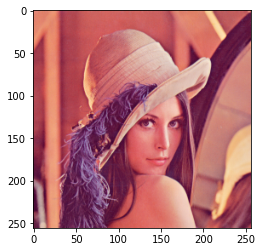

In [ ]:
lena_img = mpimg.imread('lena.bmp')
lena_noise_img = mpimg.imread('lena_noise.bmp')

plt.imshow(lena_img)


## Running

### Remove Noise with Median Filter

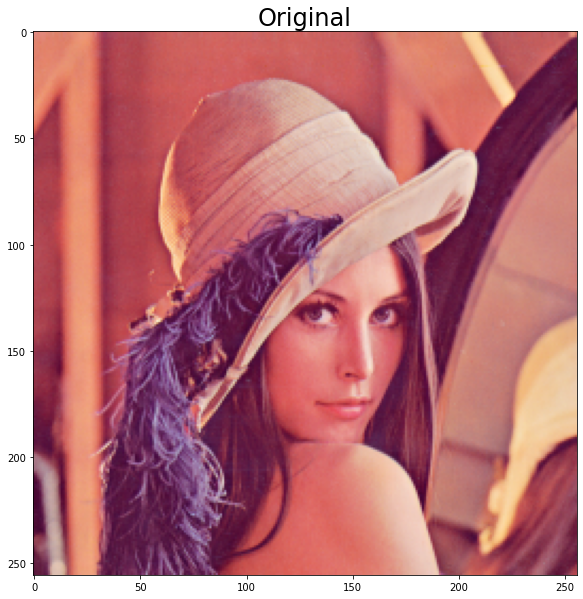

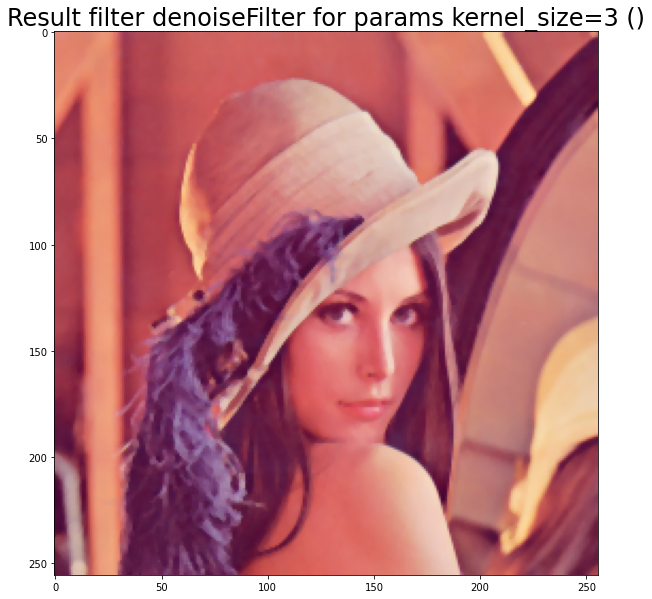

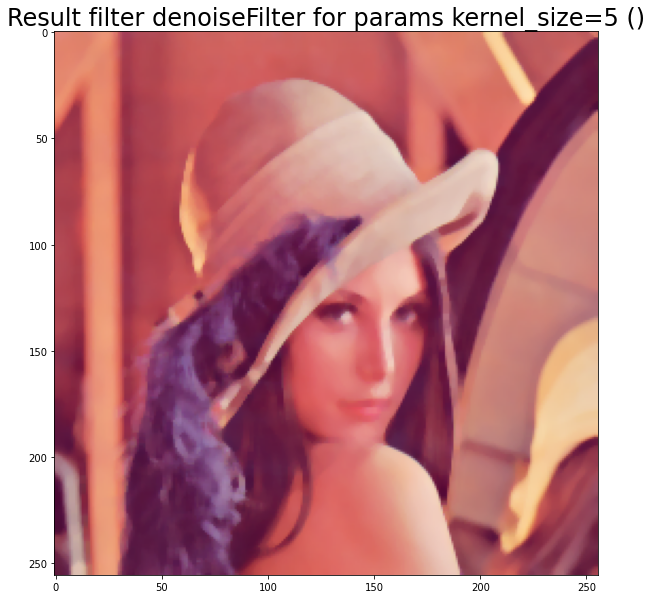

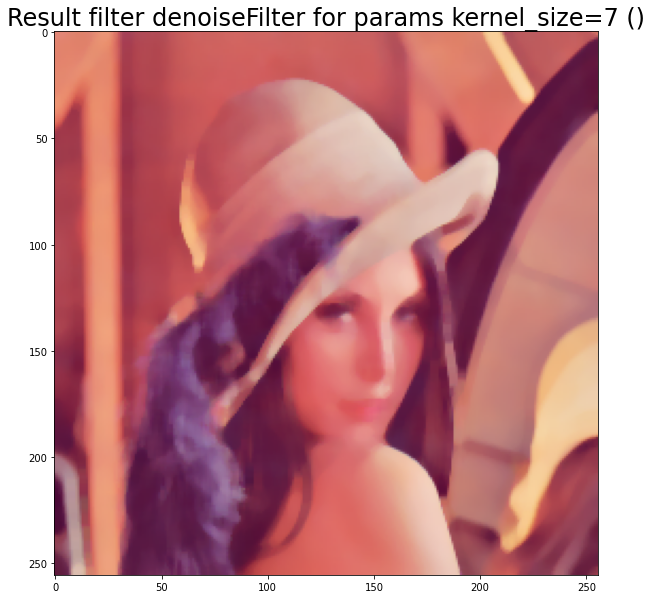

In [ ]:
s = ShowEditor(l_img)
s.showDenoiseFilter([3,5,7])

### Converting to GrayScale

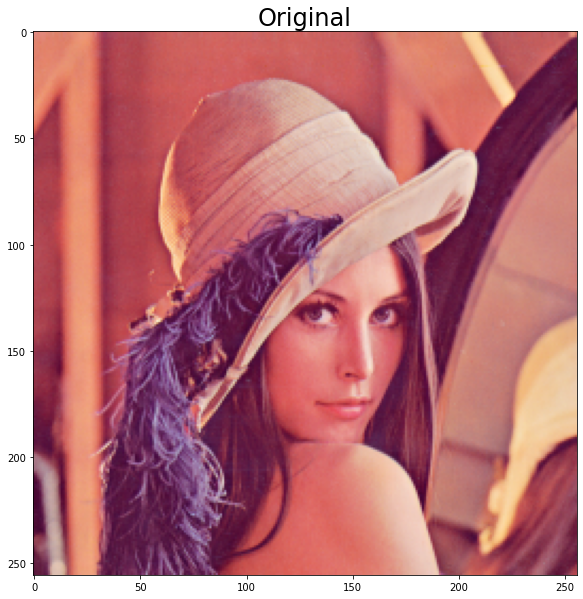

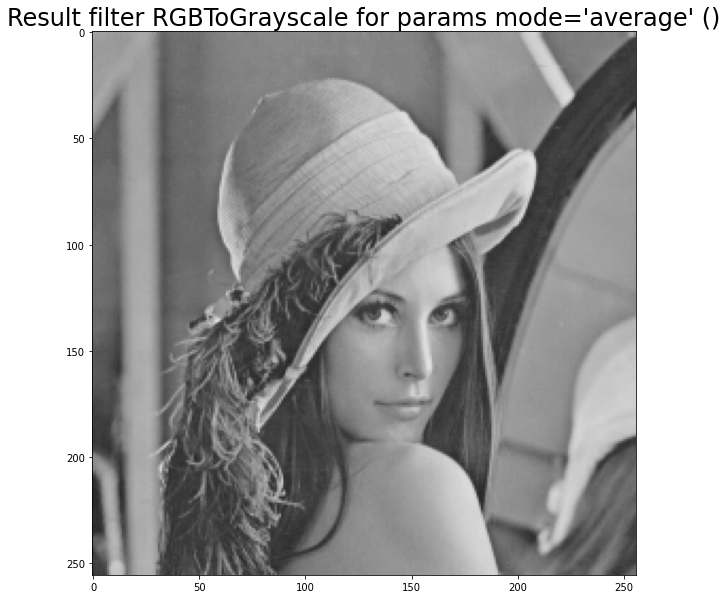

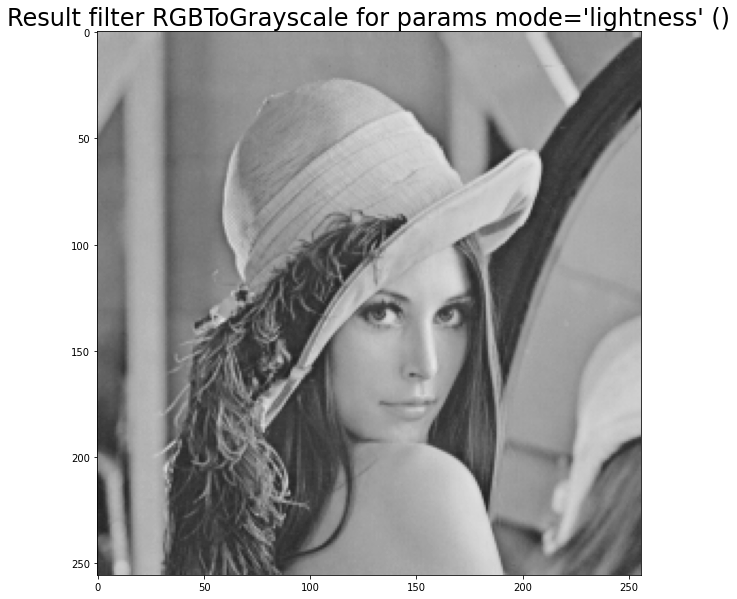

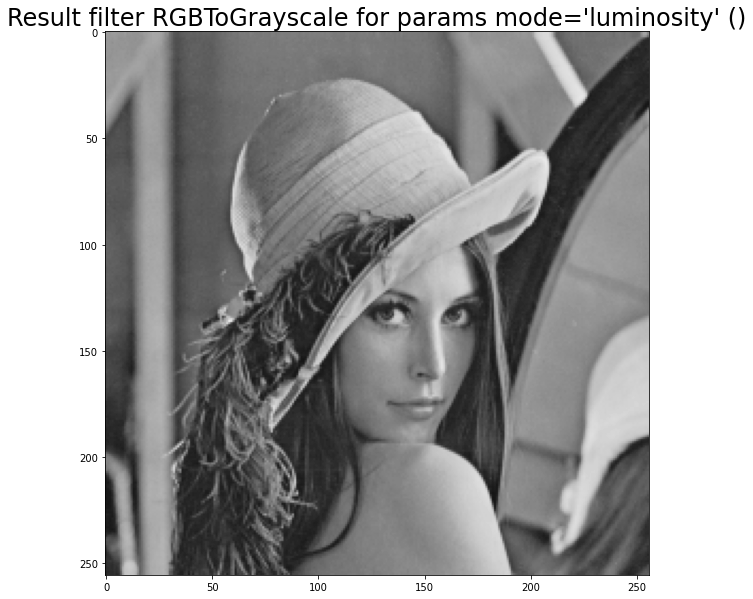

In [ ]:
s = ShowEditor(l_img)
s.showRGBToGrayscale()

### Sharpen Filter

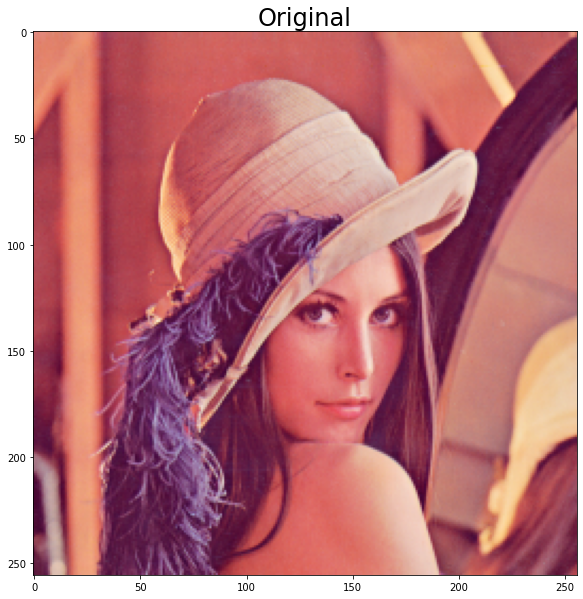

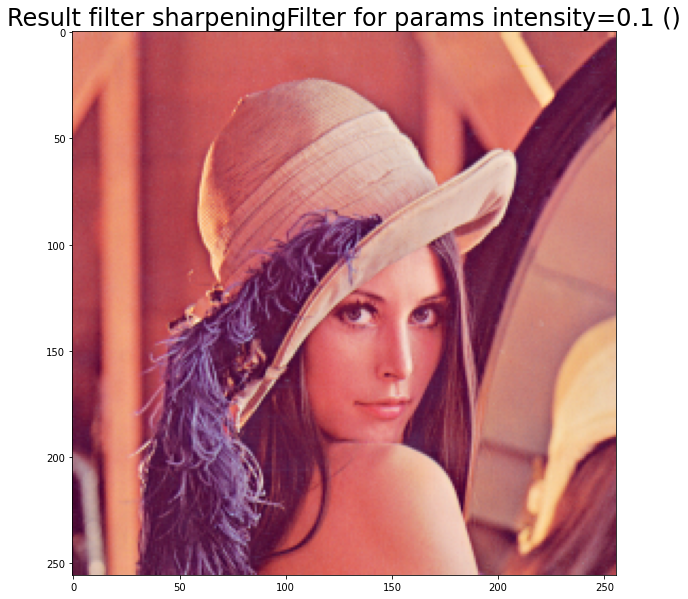

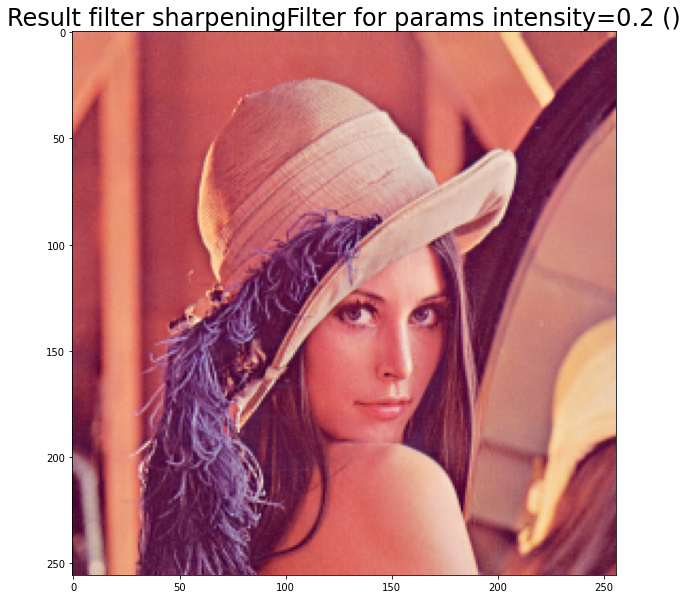

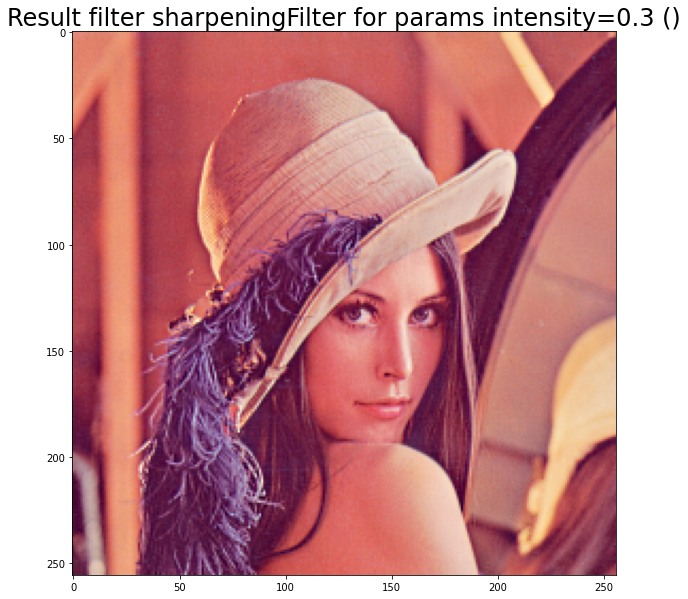

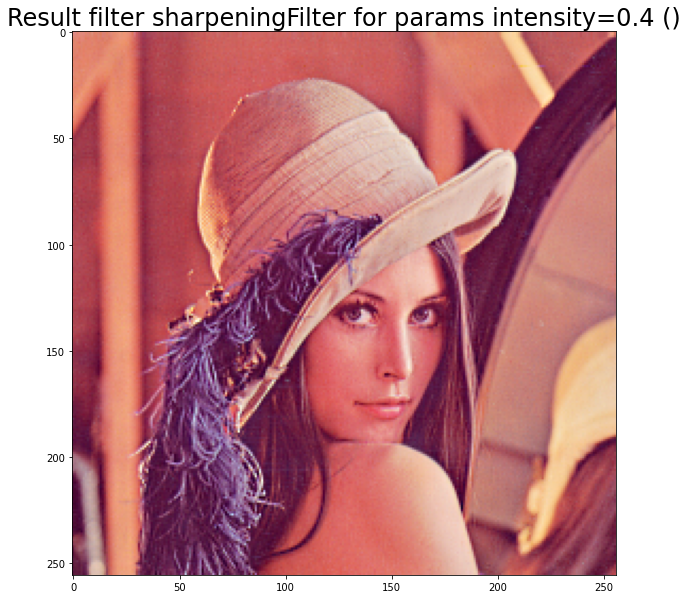

...

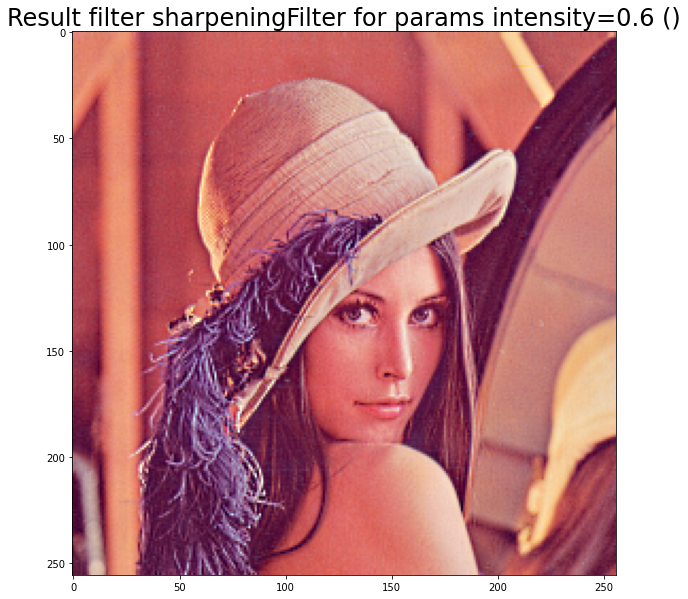

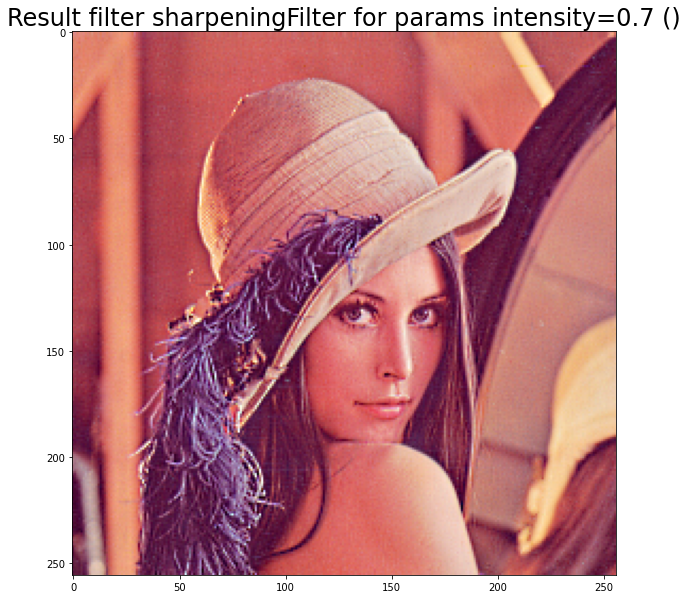

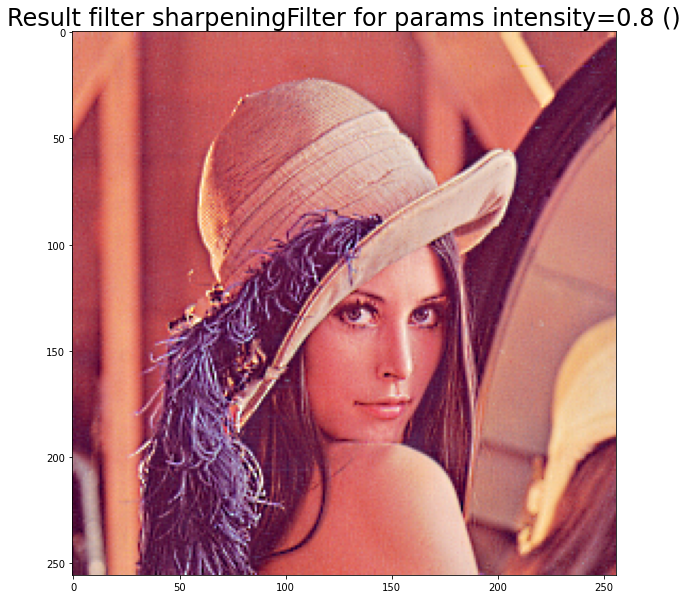

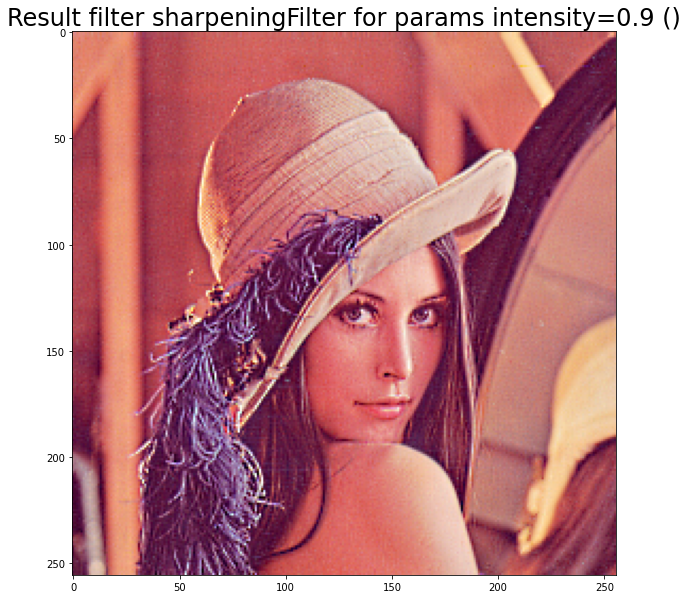

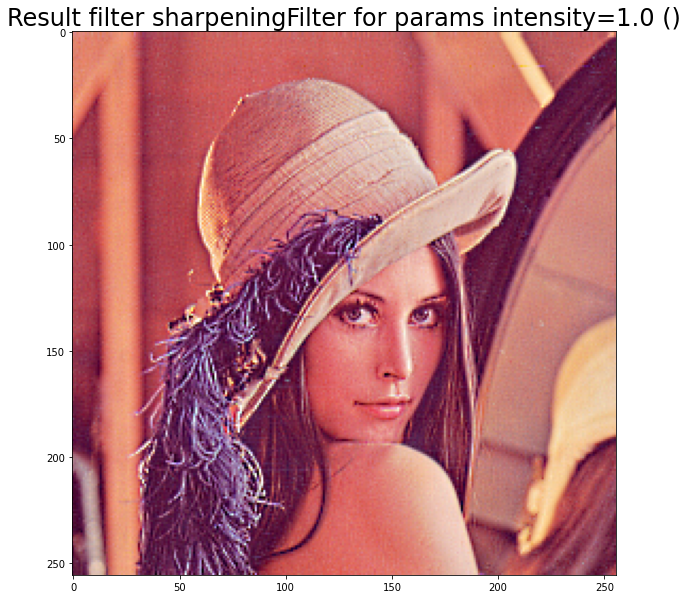

In [ ]:
s = ShowEditor(l_img)
intensities = [k/10 for k in range(1,11)]
s.showSharpeningFilter(intensities)

## Theoretical Reference

### Median Filter

      - source: https://www.geeksforgeeks.org/spatial-filters-averaging-filter-and-median-filter-in-image-processing/
      - https://en.wikipedia.org/wiki/Median_filter
      - https://www.cs.auckland.ac.nz/courses/compsci373s1c/PatricesLectures/Image%20Filtering.pdf

### Converting to Grayscale

      - https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/
      - https://medium.com/tulisan-ibe/image-conversion-using-python-and-opencv-8cd7c0ef7051
      - https://www.geeksforgeeks.org/matlab-rgb-image-to-grayscale-image-conversion/

### Sharpen Image

      - https://stackoverflow.com/questions/2938162/how-does-an-unsharp-mask-work
      - https://www.dfstudios.co.uk/articles/programming/image-programming-algorithms/image-processing-algorithms-part-5-contrast-adjustment/